In [2]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import xarray as xr
from pathlib import Path
import sys

from pystar.infrastructure import load_config
from pystar.io import (
    ImageLoader
)
from pystar.preprocessing import DataSanitizer
from pystar.registration import (
    RegistrationEngine, 
    compute_global_shift_3d, 
    create_quality_mask,
    compute_optical_flow_masked,
    register_local_bspline,          
    apply_warp_field_2d,             
    simple_correlation,
)
from pystar.spot_finding import SpotFinder, detect_spots_max3d, detect_spots_blob_dog, detect_spots_spotiflow
from pystar.mining import SignalMiner
from pystar.visualization import overlay_rgb, plot_vector_field, inspect_spots_interactive,compare_spot_algorithms

print("Laboratory initialized. Let's break some code.")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Laboratory initialized. Let's break some code.


In [3]:
# 2. Load Config & Data
config_path = "experiment_config.yaml"  # 确保路径对
try:
    cfg = load_config(config_path)
    print("Config loaded successfully.")
except Exception as e:
    print(f"Config failed: {e}")
    # 中断执行，别往下跑了
    raise

# 初始化加载器
loader = ImageLoader(cfg)

# 选择一个测试 FOV (视场)。
#test_fov_id = cfg.dataset.parsed_fovs[0] 
#print(f"Testing on FOV: {test_fov_id}")

# 加载这个 FOV 的 Dask 数据
#data_dask = loader.load_fov(test_fov_id)
#print(f"Data Loaded: {data_dask.shape}")

Config loaded successfully.


In [ ]:
# 1. 运行净化

sanitizer = DataSanitizer(cfg)
sanitizer.sanitize_fov(test_fov_id)

# 2. 直方图检查 (Visual Proof)
import tifffile
import matplotlib.pyplot as plt
import numpy as np

# 读取 Round 1 的 Raw 和 Clean (Ch0 vs Ch1，假设 Ch0 强 Ch1 弱)
raw_c0 = tifffile.imread(loader._get_path(test_fov_id, 1, 0))[15] # Z=15
clean_c0 = tifffile.imread(sanitizer.clean_dir / f"clean_fov_{test_fov_id}_round_1_ch_0.tif")[15]

raw_c1 = tifffile.imread(loader._get_path(test_fov_id, 1, 1))[15]
clean_c1 = tifffile.imread(sanitizer.clean_dir / f"clean_fov_{test_fov_id}_round_1_ch_1.tif")[15]

fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Raw 对比
axes[0, 0].imshow(raw_c0, cmap='gray', vmin=0, vmax=np.percentile(raw_c0, 99))
axes[0, 0].set_title("Raw CH0 (Z=15)")
axes[0, 1].imshow(raw_c1, cmap='gray', vmin=0, vmax=np.percentile(raw_c0, 99)) # 用 C0 的 scale 看 C1
axes[0, 1].set_title("Raw CH1 (Same Scale as CH0)")

# Clean 对比
axes[1, 0].imshow(clean_c0, cmap='gray', vmin=0, vmax=100) # 假设100是清洗后的信号强度
axes[1, 0].set_title("Clean CH0 (TopHat + Gain)")
axes[1, 1].imshow(clean_c1, cmap='gray', vmin=0, vmax=100)
axes[1, 1].set_title("Clean CH1 (TopHat + Gain)")

plt.show()

# 3. 统计检查 (Histogram)
plt.figure(figsize=(10, 5))
plt.hist(clean_c0.flatten(), bins=100, range=(1, 200), alpha=0.5, label='Clean CH0', log=True)
plt.hist(clean_c1.flatten(), bins=100, range=(1, 200), alpha=0.5, label='Clean CH1', log=True)
plt.legend()
plt.title("Histogram of CLEAN Signal (Background 0 excluded)")
plt.show()

[==================== Sanitizing FOV 1 ====================]
 [Sanitizer] Calibrating Gain Equalization (on TopHat data)...


KeyboardInterrupt: 

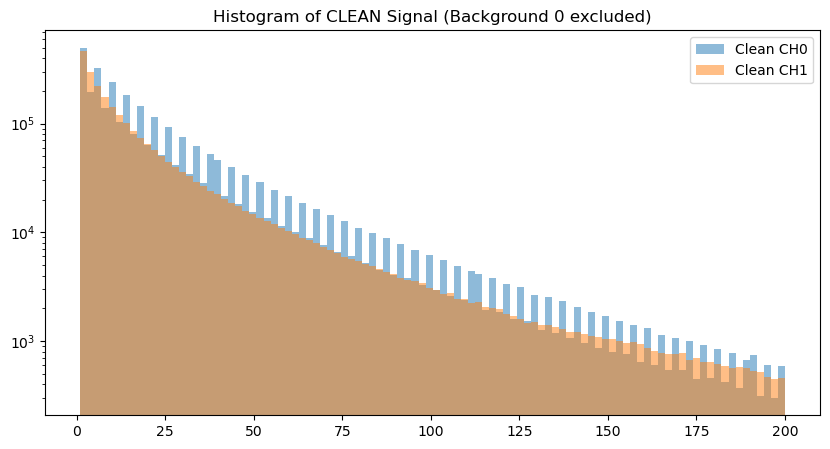

In [ ]:
plt.figure(figsize=(10, 5))
plt.hist(clean_c0.flatten(), bins=100, range=(1, 200), alpha=0.5, label='Clean CH0', log=True)
plt.hist(clean_c1.flatten(), bins=100, range=(1, 200), alpha=0.5, label='Clean CH1', log=True)
plt.legend()
plt.title("Histogram of CLEAN Signal (Background 0 excluded)")
plt.show()

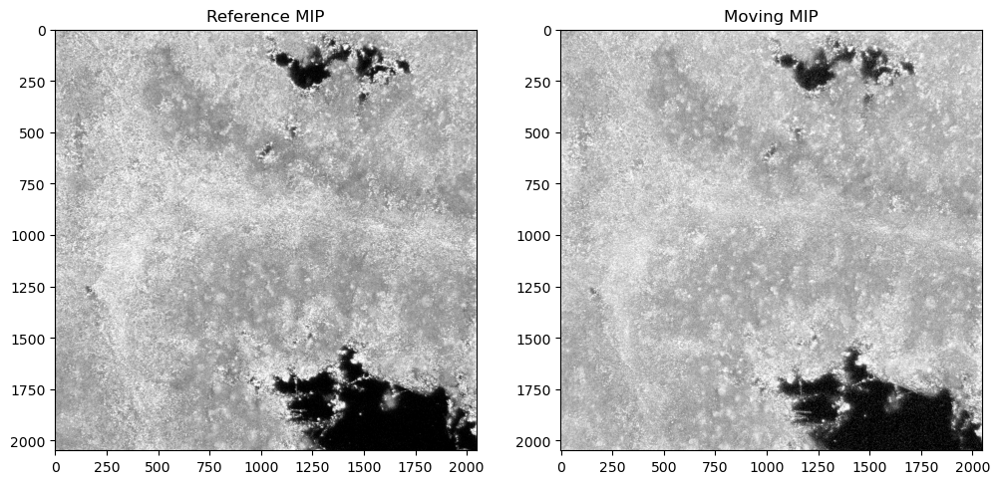

Images extracted into memory.


In [3]:
reg_engine = RegistrationEngine(cfg)

ref_round = reg_engine.reg_cfg.reference_round
ref_3d = reg_engine._load_combined_clean_volume(test_fov_id, ref_round)

mov_round = 4
mov_3d = reg_engine._load_combined_clean_volume(test_fov_id, mov_round)

# 2. 变成 2D MIP (Z-projection)
ref_2d_mip = ref_3d.max(axis=0)
mov_2d_mip = mov_3d.max(axis=0)
# 为了看清楚，我们画一下原始图
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(ref_2d_mip, cmap='gray', vmin=0, vmax=np.percentile(ref_2d_mip, 99))
ax[0].set_title("Reference MIP")
ax[1].imshow(mov_2d_mip, cmap='gray', vmin=0, vmax=np.percentile(mov_2d_mip, 99))
ax[1].set_title("Moving MIP")
plt.show()

print("Images extracted into memory.")

Global Shift Calculated: [-0.2 -8.   4.4] (dz, dy, dx)
FFT Score: 0.2845
Post-Global Registration Correlation: 0.42924


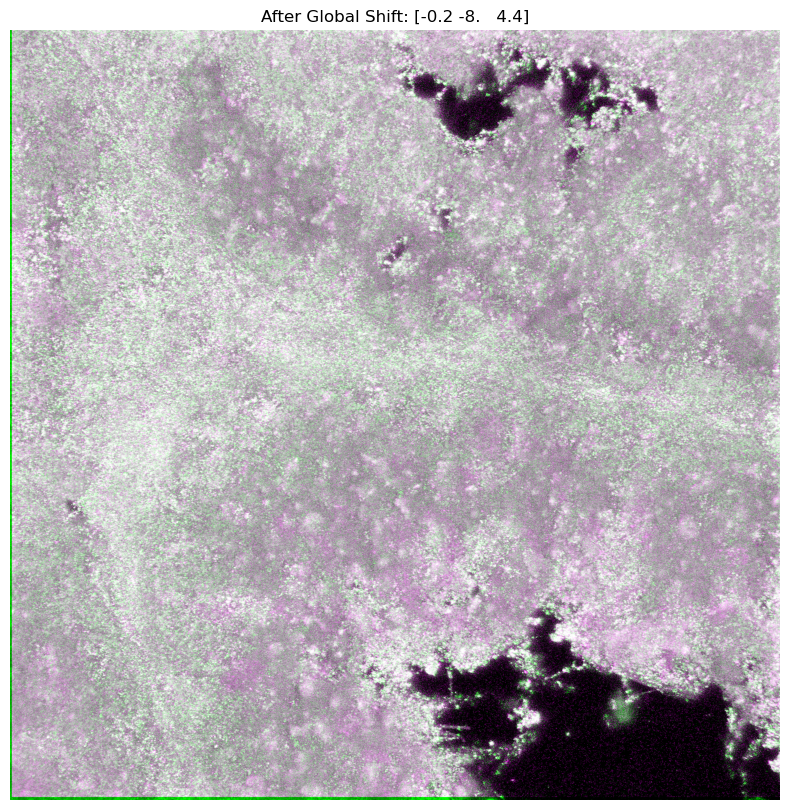

In [4]:
# 4. Run Global Registration First
# 我们直接调用 compute_global_shift_3d

shift_3d, corr = compute_global_shift_3d(
    ref_3d, 
    mov_3d, 
    downsample_factor=4, # 加速
    max_shift=200
)

print(f"Global Shift Calculated: {shift_3d} (dz, dy, dx)")
print(f"FFT Score: {corr:.4f}")#1-[频域（Frequency Domain）里这两张图重叠的相位一致性]

# 应用这个 Shift 到 2D MIP 上
from scipy.ndimage import shift as scipy_shift
shift_2d = shift_3d[1:] # 只要 dy, dx

# 这一步是把 Moving 图挪到大致正确的位置
mov_2d_shifted = scipy_shift(mov_2d_mip, shift_2d, order=1)

#计算全局配准后的相关性
global_corr = simple_correlation(ref_2d_mip, mov_2d_shifted)
print(f"Post-Global Registration Correlation: {global_corr:.5f}")

# 可视化检查：全局配准后长什么样？
plt.figure(figsize=(10, 10))
plt.imshow(overlay_rgb(ref_2d_mip, mov_2d_shifted))
plt.title(f"After Global Shift: {shift_3d}")
plt.axis('off')
plt.show()

In [ ]:
# Cell: Interactive B-Spline Lab (Fixed - Manual Trigger Only)
import ipywidgets as widgets
from IPython.display import display, clear_output
from pystar.infrastructure import BsplineConfig
import matplotlib.pyplot as plt
import numpy as np

mask = create_quality_mask(ref_2d_mip, edge_margin=50)

# 1. 定义输出区域 (Log & Plot)
# 这是一个独立的容器，不会因为你动滑块就被清空
out_display = widgets.Output()

# 2. 定义控件
style = {'description_width': 'initial'}
w_spacing = widgets.IntSlider(value=60, min=20, max=200, step=10, description='Grid Spacing (px):', style=style)
w_iter = widgets.IntSlider(value=100, min=10, max=500, step=10, description='Iterations:', style=style)
w_vector = widgets.Checkbox(value=True, description='Show Vector Field')
run_btn = widgets.Button(description="▶ Run Registration", button_style='success', icon='play')

# 3. 核心逻辑函数 (它不接受参数，而是去读控件当前的值)
def on_run_click(b):
    # 获取当前滑块的值
    img_spacing = w_spacing.value
    img_iter = w_iter.value
    show_vec = w_vector.value
    
    # 清空输出区域，但保留 Output Widget 本身
    # wait=True 防止闪烁：它会等新内容出来再清除旧的
    out_display.clear_output(wait=True)
    
    with out_display:
        print(f" Processing... [Spacing={img_spacing}, Iter={img_iter}]")
        
        # --- A. 配置 ---
        temp_cfg = BsplineConfig(
            grid_spacing=img_spacing,
            num_iter=img_iter
        )
        
        # --- B. 计算 (Heavy Lifting) ---
        try:
            flow = register_local_bspline(
                ref_2d_mip, 
                mov_2d_shifted, 
                mask, 
                config_obj=temp_cfg
            )
        except Exception as e:
            print(f" Error during registration: {e}")
            return

        if flow is None:
            print(" Registration Failed/Diverged.")
            return

        # --- C. 应用与评估 ---
        mov_final = apply_warp_field_2d(mov_2d_shifted, flow)
        corr = simple_correlation(ref_2d_mip, mov_final)
        
        print(f" DONE. Final Correlation = {corr:.5f}")
        
        # --- D. 画图 ---
        fig = plt.figure(figsize=(16, 8))
        
        # Left: Overlay
        ax1 = fig.add_subplot(1, 2, 1)
        ax1.imshow(overlay_rgb(ref_2d_mip, mov_final))
        ax1.set_title(f"Spacing={img_spacing}, Iter={img_iter}\nCorr: {corr:.4f}")
        ax1.axis('off')
        
        # Right: Vectors
        if show_vec:
            ax2 = fig.add_subplot(1, 2, 2)
            step = max(10, img_spacing // 2)
            
            dy, dx = flow[0], flow[1]
            h, w = dy.shape
            y, x = np.mgrid[0:h:step, 0:w:step]
            u = dx[0:h:step, 0:w:step]
            v = dy[0:h:step, 0:w:step]
            
            ax2.imshow(np.zeros_like(ref_2d_mip), cmap='gray')
            ax2.quiver(x, y, u, v, angles='xy', scale_units='xy', scale=0.5, color='yellow')
            ax2.invert_yaxis()
            ax2.set_title(f"Deformation Field (Step={step})")
            ax2.axis('off')
        
        plt.tight_layout()
        plt.show()

# 4. 绑定按钮事件
run_btn.on_click(on_run_click)

# 5. 组装 UI 布局
ui_layout = widgets.VBox([
    widgets.HBox([w_spacing, w_iter]),
    widgets.HBox([w_vector, run_btn]),
    widgets.HTML("<hr>"), # 分割线
    out_display # 图会画在这里
])

# 6. 显示
display(ui_layout)

Starting Grid Search (18 combinations)...
 -> Spacing= 15, Iter= 50 | Corr=0.4928 | MaxDisp=44.0px | Time=257.9s
 -> Spacing= 15, Iter= 70 | Corr=0.4928 | MaxDisp=44.0px | Time=255.6s
 -> Spacing= 17, Iter= 50 | Corr=0.4909 | MaxDisp=34.2px | Time=212.3s
 -> Spacing= 17, Iter= 70 | Corr=0.4909 | MaxDisp=34.2px | Time=213.2s
 -> Spacing= 20, Iter= 50 | Corr=0.4870 | MaxDisp=26.7px | Time=157.2s
 -> Spacing= 20, Iter= 70 | Corr=0.4870 | MaxDisp=26.7px | Time=154.3s
 -> Spacing= 25, Iter= 50 | Corr=0.4836 | MaxDisp=21.9px | Time=90.4s
 -> Spacing= 25, Iter= 70 | Corr=0.4836 | MaxDisp=21.9px | Time=88.6s
 -> Spacing= 30, Iter= 50 | Corr=0.4861 | MaxDisp=19.3px | Time=153.0s
 -> Spacing= 30, Iter= 70 | Corr=0.4861 | MaxDisp=19.3px | Time=151.3s
 -> Spacing= 35, Iter= 50 | Corr=0.4843 | MaxDisp=15.6px | Time=115.7s
 -> Spacing= 35, Iter= 70 | Corr=0.4843 | MaxDisp=15.6px | Time=114.8s
 -> Spacing= 40, Iter= 50 | Corr=0.4832 | MaxDisp=13.3px | Time=81.7s
 -> Spacing= 40, Iter= 70 | Corr=0.483

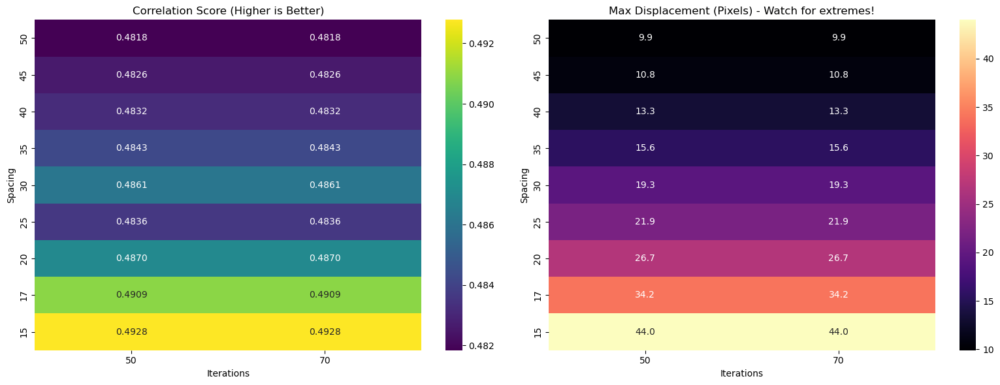


 Highest Correlation Run:
Spacing            15.000000
Iterations         50.000000
Correlation         0.492780
MaxDisplacement    44.011527
Name: 0, dtype: float64


In [5]:
# Cell: Grid Search Strategy
import seaborn as sns
import pandas as pd
import time
from pystar.infrastructure import BsplineConfig

# === 定义你的搜索范围 ===
# 根据上一步交互实验的结果来缩小这里的范围
search_spacings = [15, 17, 20, 25, 30, 35, 40, 45, 50]
search_iters = [50, 70]

results = []

print(f"Starting Grid Search ({len(search_spacings) * len(search_iters)} combinations)...")

for s in search_spacings:
    for i in search_iters:
        start_t = time.time()
        
        # 配置
        cfg_temp = BsplineConfig(grid_spacing=s, num_iter=i)
        
        # 运行
        flow = register_local_bspline(ref_2d_mip, mov_2d_shifted, mask=None, config_obj=cfg_temp)
        
        if flow is not None:
            mov_fin = apply_warp_field_2d(mov_2d_shifted, flow)
            corr = simple_correlation(ref_2d_mip, mov_fin)
            elapsed = time.time() - start_t
            
            # 记录最大形变量 (Max Displacement)，用于判断是否过拟合
            max_disp = np.sqrt(flow[0]**2 + flow[1]**2).max()
            
            print(f" -> Spacing={s:3d}, Iter={i:3d} | Corr={corr:.4f} | MaxDisp={max_disp:.1f}px | Time={elapsed:.1f}s")
            
            results.append({
                'Spacing': s,
                'Iterations': i,
                'Correlation': corr,
                'MaxDisplacement': max_disp
            })
        else:
            print(f" -> Spacing={s:3d}, Iter={i:3d} | FAILED")

# 转换为 DataFrame
df_res = pd.DataFrame(results)

# === 可视化热力图 ===
if not df_res.empty:
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # 1. 核心指标：Correlation Heatmap
    pivot_corr = df_res.pivot(index="Spacing", columns="Iterations", values="Correlation")
    sns.heatmap(pivot_corr, annot=True, fmt=".4f", cmap="viridis", ax=axes[0])
    axes[0].set_title("Correlation Score (Higher is Better)")
    axes[0].invert_yaxis() # 让小间距(精细)在上面，符合直觉
    
    # 2. 警惕指标：Max Displacement
    # 如果这个值异常大，说明图像被撕扯了
    pivot_disp = df_res.pivot(index="Spacing", columns="Iterations", values="MaxDisplacement")
    sns.heatmap(pivot_disp, annot=True, fmt=".1f", cmap="magma", ax=axes[1])
    axes[1].set_title("Max Displacement (Pixels) - Watch for extremes!")
    axes[1].invert_yaxis()
    
    plt.tight_layout()
    plt.show()
    
    # 找出最优解
    best_run = df_res.loc[df_res['Correlation'].idxmax()]
    print("\n Highest Correlation Run:")
    print(best_run)
else:
    print("No valid results found.")

Running B-Spline with spacing=17, iter=30...
B-Spline Finished.
Final Correlation: 0.67649


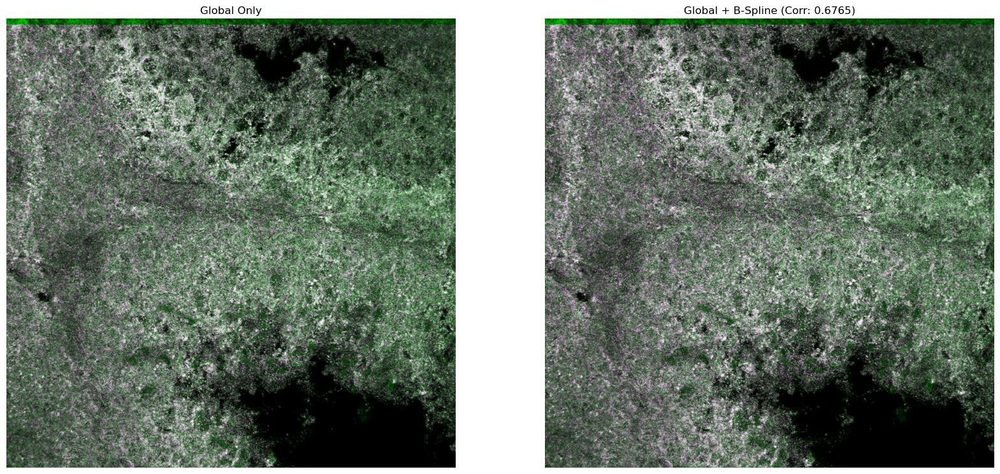

Deformation Field (Yellow Arrows):


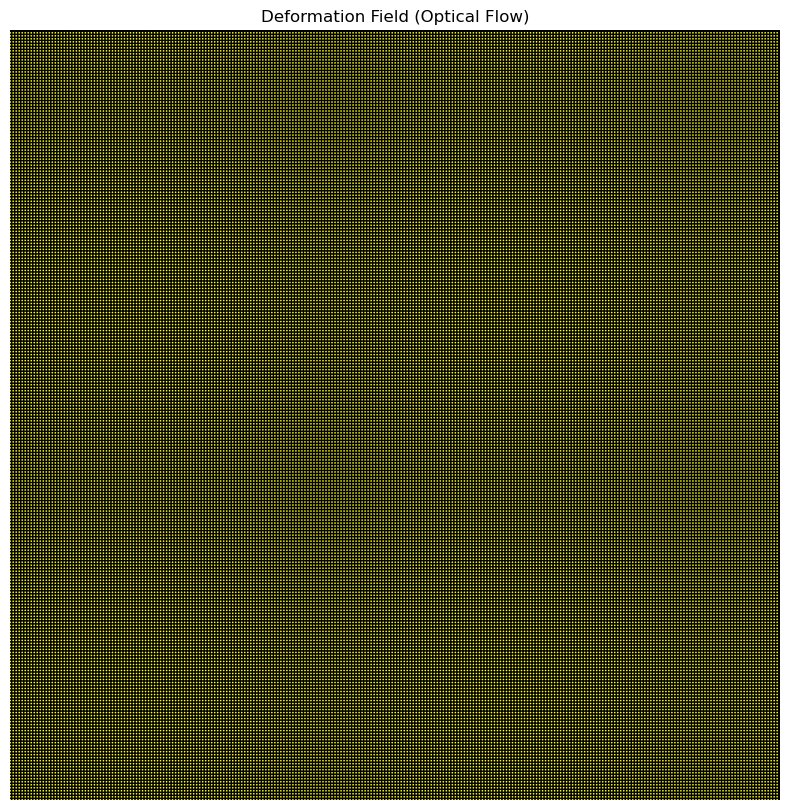

In [5]:
# 5. B-Spline Laboratory
# ========================
# 你可以在这里调整参数！
# ========================

# 定义实验参数
from pystar.infrastructure import BsplineConfig

if 'mask' not in locals():
    mask = create_quality_mask(ref_2d_mip, edge_margin=50)

# --------------- 调参区 ---------------
spacing_test = 17  
iter_test = 30     
# -------------------------------------

# 创建一个临时的配置对象
test_bspline_cfg = BsplineConfig(
    grid_spacing=spacing_test,
    num_iter=iter_test
)

print(f"Running B-Spline with spacing={spacing_test}, iter={iter_test}...")

# 运行 B-Spline
# 注意：输入是 Ref 和 已经被全局移动过的 Mov
flow_field = register_local_bspline(
    ref_2d_mip, 
    mov_2d_shifted, 
    mask, 
    test_bspline_cfg
)

if flow_field is None:
    print("B-Spline Failed! Check your SimpleITK installation or image data.")
else:
    print("B-Spline Finished.")
    
    # 应用变形场看结果
    mov_final = apply_warp_field_2d(mov_2d_shifted, flow_field)
    
    # 计算新的 Correlation
    corr_final = simple_correlation(ref_2d_mip, mov_final)
    print(f"Final Correlation: {corr_final:.5f}")#中心区域皮尔逊相关系数

    # --- 终极可视化 ---
    
    # 1. 对比图
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))
    
    # 左图：只做全局配准
    axes[0].imshow(overlay_rgb(ref_2d_mip, mov_2d_shifted))
    axes[0].set_title("Global Only")
    axes[0].axis('off')
    
    # 右图：全局 + B-Spline
    axes[1].imshow(overlay_rgb(ref_2d_mip, mov_final))
    axes[1].set_title(f"Global + B-Spline (Corr: {corr_final:.4f})")
    axes[1].axis('off')
    plt.show()
    
    # 2. 变形场 (Vector Field) - 检查物理合理性
    # 如果箭头平滑，说明是凝胶形变（Good）。
    # 如果箭头乱飞，说明过拟合了（Bad -> 调大 spacing）。
    print("Deformation Field (Yellow Arrows):")
    plot_vector_field(flow_field, step=spacing_test//2) # 这里的 step 只是显示密度

In [ ]:
import ipywidgets as widgets
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import display

# 1. 定义输出显示区域
out_spot_debug = widgets.Output()

# 2. 定义寻点专用控件
style = {'description_width': 'initial'}
w_thresh = widgets.FloatSlider(
    value=0.05, min=0.01, max=0.50, step=0.01, 
    description='Threshold (Relative):', style=style
)
w_dist = widgets.IntSlider(
    value=3, min=1, max=10, step=1, 
    description='Min Distance (px):', style=style
)
w_z_layer = widgets.IntSlider(
    value=ref_3d.shape[0]//2, min=0, max=ref_3d.shape[0]-1, 
    description='Z-Plane:', style=style
)
run_find_btn = widgets.Button(description="▶ Update Spots", button_style='primary')

# 3. 寻点逻辑
def on_find_click(b):
    #b.description = "Working..."
    out_spot_debug.clear_output(wait=True)
    
    with out_spot_debug:
        # A. 运行快速寻点函数
        print(f"Finding spots with Thresh={w_thresh.value}, Dist={w_dist.value}...")
        df_max3d = detect_spots_max3d(
            ref_3d, 
            threshold_rel=w_thresh.value, 
            min_dist=w_dist.value
        )
        
        # B. 调用可视化工具检查结果
        inspect_spots_interactive(
            ref_3d, 
            df_max3d, 
            z_plane=w_z_layer.value, 
            roi_size=300
        )
        
        print(f"Stats: Found {len(current_spots)} total spots in 3D volume.")
        
        
            

# 绑定事件
run_find_btn.on_click(on_find_click)

# 4. 布局显示
ui_spot_finder = widgets.VBox([
    widgets.HBox([w_thresh, w_dist, w_z_layer]),
    run_find_btn,
    widgets.HTML("<hr>"),
    out_spot_debug
])

display(ui_spot_finder)


In [3]:
spotfinder = SpotFinder(cfg)
ref_round = 1

#合并seq channel 构造伪4d数组 ref_4d
roles = spotfinder.cfg.dataset.channel_roles
channels = sorted([c for c, role in roles.items() if role == 'seq'])

ref_seq = []
for c in channels:
        # 使用 loader 从 clean_data 目录读取
        vol = spotfinder.loader.load_clean_image(test_fov_id, ref_round, c)
        ref_seq.append(vol)
ref_4d = np.stack([ref_seq[i] for i in range(len(ref_seq))], axis=0)

In [4]:
# --- 1. Max3D (快速) ---
print("\n[Method 1] 运行 Max3D...")
df_max3d = detect_spots_max3d(ref_4d, threshold=0.05, min_dist=2)
df_max3d


[Method 1] 运行 Max3D...


,z,y,x,channel
0,2,5,403,0
1,2,36,751,0
2,2,40,627,0
3,2,60,1238,0
4,2,100,882,0
...,...,...,...,...
1624349,39,2032,278,2
1624350,39,2032,316,2
1624351,39,2041,852,2
1624352,39,2044,419,2


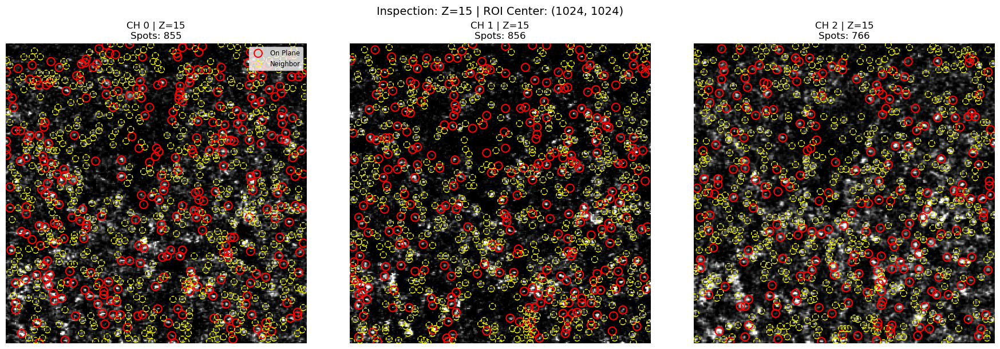

In [5]:
inspect_spots_interactive(
            ref_4d, 
            df_max3d, 
            z_plane=15, 
            roi_size=256
        )

In [ ]:
# 先无阈值跑一遍，拿到所有候选点的 DoG 响应
df_dog0 = detect_spots_blob_dog(ref_4d,min_sigma= (0.5, 1.0, 1.0),max_sigma= (2.0, 7.0, 7.0), threshold=0,overlap=0.5)
dog_resp = df_dog0['dog_response'].values

plt.hist(dog_resp, bins=50)
plt.xlabel('DoG response')
plt.ylabel('count')
plt.show()

print('min={:.2f}, 10%={:.2f}, median={:.2f}, max={:.2f}'.format(
      dog_resp.min(),
      np.percentile(dog_resp, 10),
      np.median(dog_resp),
      dog_resp.max()))

In [ ]:
# --- 2. DoG (数学派) ---
print("[Method 2] 运行 Blob DoG...")

df_dog = detect_spots_blob_dog(ref_seq[0],min_sigma= (0.5, 1.0, 1.0),max_sigma= (2.0, 5.0, 5.0), threshold=0.1,overlap=0.5)
df_dog

[Method 2] 运行 Blob DoG...


,z,y,x,sigma_z,sigma_y,sigma_x,channel
0,2.0,505.0,999.0,0.5,1.0,1.0,0
1,0.0,1034.0,1161.0,0.5,1.0,1.0,0
2,5.0,109.0,176.0,0.5,1.0,1.0,0
3,2.0,1073.0,617.0,0.5,1.0,1.0,0
4,1.0,1164.0,1370.0,0.5,1.0,1.0,0
...,...,...,...,...,...,...,...
2163107,0.0,924.0,1211.0,0.5,1.0,1.0,0
2163108,32.0,1858.0,869.0,0.5,1.0,1.0,0
2163109,41.0,1221.0,568.0,0.5,1.0,1.0,0
2163110,23.0,508.0,1892.0,0.5,1.0,1.0,0


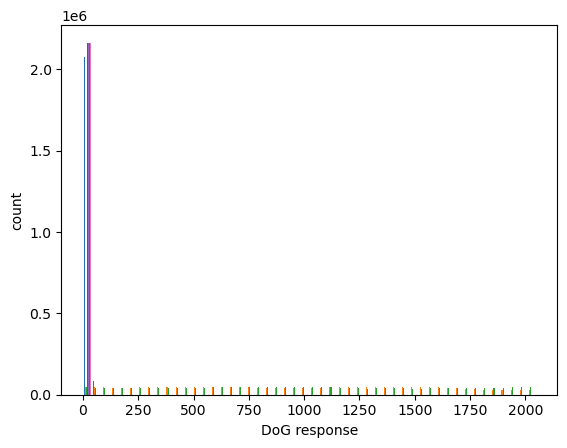

TypeError: unsupported format string passed to Series.__format__

In [6]:
plt.hist(df_dog, bins=50)
plt.xlabel('DoG response')
plt.ylabel('count')
plt.show()

print('min={:.2f}, 10%={:.2f}, median={:.2f}, max={:.2f}'.format(
    df_dog.min(),
    np.percentile(df_dog, 10),
    np.median(df_dog),
    df_dog.max()))

In [6]:
# --- 2. DoG (数学派) ---
print("[Method 2] 运行 Blob DoG...")

df_dog = detect_spots_blob_dog(ref_4d,min_sigma= (0.5, 1.0, 1.0),max_sigma= (2.0, 5.0, 5.0), threshold=0.1,overlap=0.5)
df_dog

[Method 2] 运行 Blob DoG...


,z,y,x,sigma_z,sigma_y,sigma_x,channel
0,2.0,505.0,999.0,0.5,1.0,1.0,0
1,0.0,1034.0,1161.0,0.5,1.0,1.0,0
2,5.0,109.0,176.0,0.5,1.0,1.0,0
3,2.0,1073.0,617.0,0.5,1.0,1.0,0
4,1.0,1164.0,1370.0,0.5,1.0,1.0,0
...,...,...,...,...,...,...,...
6193837,14.0,1734.0,987.0,0.5,1.0,1.0,2
6193838,22.0,1523.0,889.0,0.5,1.0,1.0,2
6193839,8.0,119.0,1306.0,0.5,1.0,1.0,2
6193840,3.0,485.0,1996.0,0.5,1.0,1.0,2


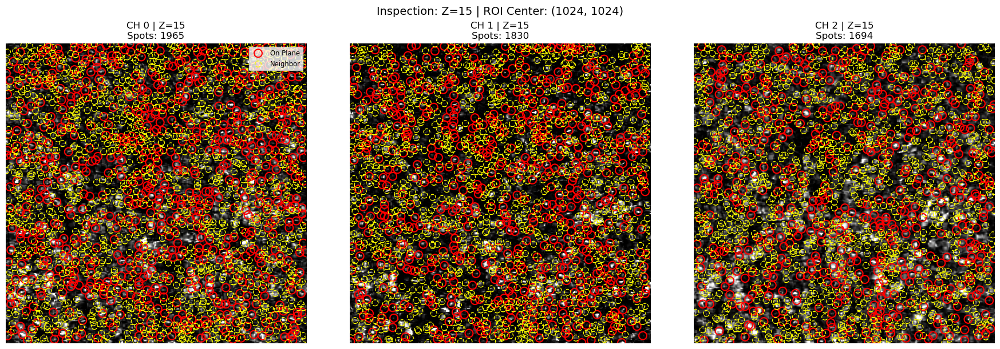

In [7]:
inspect_spots_interactive(
            ref_4d, 
            df_dog, 
            z_plane=15, 
            roi_size=256
        )

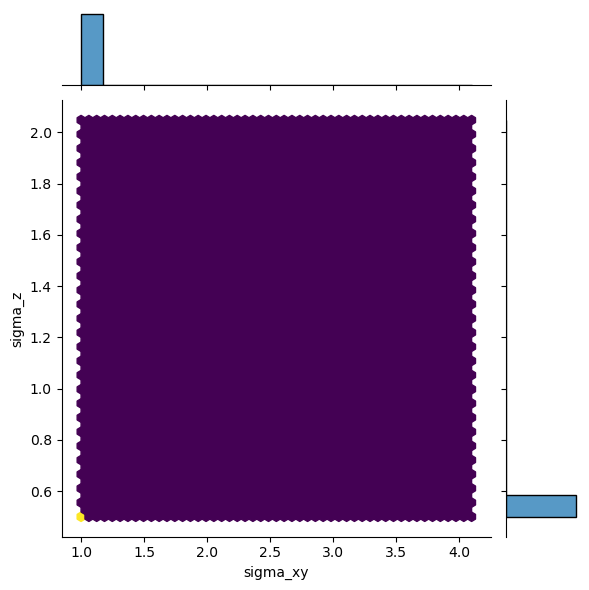

In [8]:
df_dog['sigma_xy'] = (df_dog['sigma_y'] + df_dog['sigma_x']) / 2

sns.jointplot(data=df_dog.sample(100000), x='sigma_xy', y='sigma_z', 
            kind='hex', cmap='viridis') # 使用 hexbin 避免散点重叠
plt.show()

In [ ]:
# --- 3. Spotiflow (深度学习派) ---
print("[Method 3] 运行 Spotiflow...")
# 第一次运行会下载模型，可能有点慢
df_flow = detect_spots_spotiflow(ref_4d, model_name="smfish_3d", prob_thresh=0.5)
df_flow

[Method 3] 运行 Spotiflow...
 [Spotiflow] 正在加载模型: smfish_3d...
INFO:spotiflow.model.spotiflow:Loading pretrained model: smfish_3d
 [Spotiflow] 正在预测，概率阈值: 0.5
INFO:spotiflow.model.spotiflow:Will use device: cuda:0
INFO:spotiflow.model.spotiflow:Predicting with prob_thresh = 0.5, min_distance = 1
INFO:spotiflow.model.spotiflow:Peak detection mode: fast
INFO:spotiflow.model.spotiflow:Image shape (30, 3072, 3072)
INFO:spotiflow.model.spotiflow:Predicting with (1, 12, 12) tiles
INFO:spotiflow.model.spotiflow:Normalizing...
INFO:spotiflow.model.spotiflow:Padding to shape (32, 3072, 3072, 1)


Predicting tiles:   0%|          | 0/144 [00:00<?, ?it/s]

INFO:spotiflow.model.spotiflow:Found 67965 spots
 [Spotiflow] 正在预测，概率阈值: 0.5
INFO:spotiflow.model.spotiflow:Will use device: cuda:0
INFO:spotiflow.model.spotiflow:Predicting with prob_thresh = 0.5, min_distance = 1
INFO:spotiflow.model.spotiflow:Peak detection mode: fast
INFO:spotiflow.model.spotiflow:Image shape (30, 3072, 3072)
INFO:spotiflow.model.spotiflow:Predicting with (1, 12, 12) tiles
INFO:spotiflow.model.spotiflow:Normalizing...
INFO:spotiflow.model.spotiflow:Padding to shape (32, 3072, 3072, 1)


Predicting tiles:   0%|          | 0/144 [00:00<?, ?it/s]

INFO:spotiflow.model.spotiflow:Found 91410 spots
 [Spotiflow] 正在预测，概率阈值: 0.5
INFO:spotiflow.model.spotiflow:Will use device: cuda:0
INFO:spotiflow.model.spotiflow:Predicting with prob_thresh = 0.5, min_distance = 1
INFO:spotiflow.model.spotiflow:Peak detection mode: fast
INFO:spotiflow.model.spotiflow:Image shape (30, 3072, 3072)
INFO:spotiflow.model.spotiflow:Predicting with (1, 12, 12) tiles
INFO:spotiflow.model.spotiflow:Normalizing...
INFO:spotiflow.model.spotiflow:Padding to shape (32, 3072, 3072, 1)


Predicting tiles:   0%|          | 0/144 [00:00<?, ?it/s]

INFO:spotiflow.model.spotiflow:Found 73804 spots
 [Spotiflow] 正在预测，概率阈值: 0.5
INFO:spotiflow.model.spotiflow:Will use device: cuda:0
INFO:spotiflow.model.spotiflow:Predicting with prob_thresh = 0.5, min_distance = 1
INFO:spotiflow.model.spotiflow:Peak detection mode: fast
INFO:spotiflow.model.spotiflow:Image shape (30, 3072, 3072)
INFO:spotiflow.model.spotiflow:Predicting with (1, 12, 12) tiles
INFO:spotiflow.model.spotiflow:Normalizing...
INFO:spotiflow.model.spotiflow:Padding to shape (32, 3072, 3072, 1)


Predicting tiles:   0%|          | 0/144 [00:00<?, ?it/s]

INFO:spotiflow.model.spotiflow:Found 116780 spots


,z,y,x,intensity,prob,channel
0,27.780225,318.147274,278.131424,0.696479,0.559689,0
1,28.700598,318.988371,246.724438,0.924487,0.512008,0
2,28.314522,319.772344,211.178094,0.859641,0.566115,0
3,28.588158,313.488020,258.058049,0.813132,0.503186,0
4,27.234709,311.771168,280.107218,0.792731,0.523313,0
...,...,...,...,...,...,...
349954,1.143533,2892.393885,2996.311724,0.132323,0.617860,3
349955,2.083206,2889.075156,3031.686255,0.238267,0.516773,3
349956,0.649044,3062.891787,3044.702841,0.216280,0.500581,3
349957,0.847317,3048.570720,2996.302243,0.089195,0.502077,3


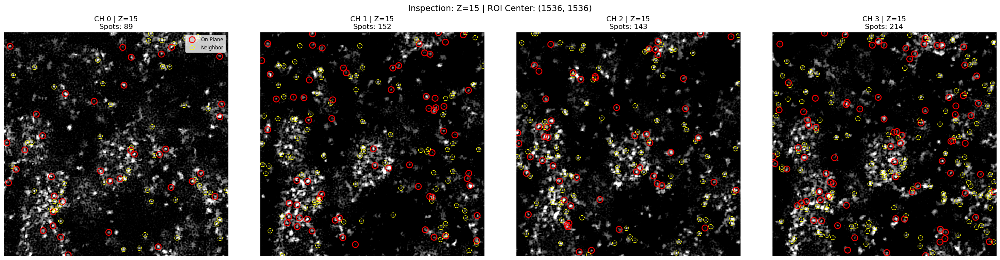

: 

In [ ]:
inspect_spots_interactive(
            ref_4d, 
            df_flow, 
            z_plane=15, 
            roi_size=512
        )

In [ ]:
# 汇总结果
results = {
    'Max3D (Baseline)': df_max3d,
    'DoG (Traditional)': df_dog,
    'Spotiflow (Modern)': df_flow
}

: 

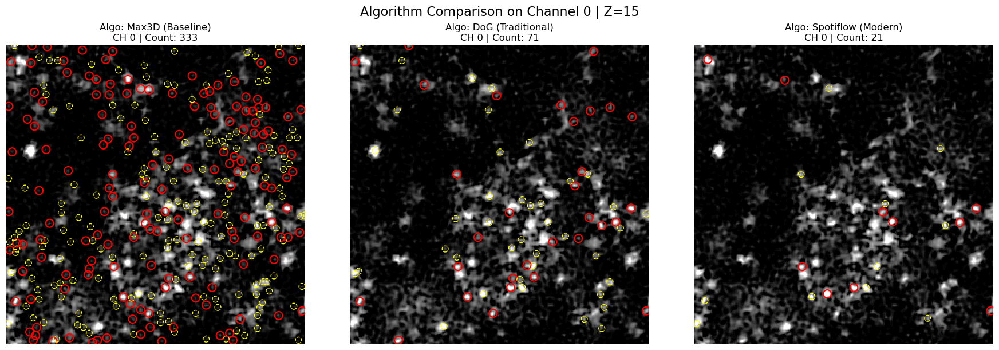

: 

: 

In [ ]:
# 选一个 Z 层，选一个你感兴趣的区域（比如图像中心）进行对比
# 建议多换几个 center 看看，尤其是边缘和高亮度斑块密集的区域
compare_spot_algorithms(
    ref_4d, 
    results,
    channel_id=0, 
    z_plane=15,          
    center=(1536, 1536), # 图像中心 ROI
    roi_size=256         
)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Loaded 1321271 spots.
Starting Extraction Scan...
Extraction Done.


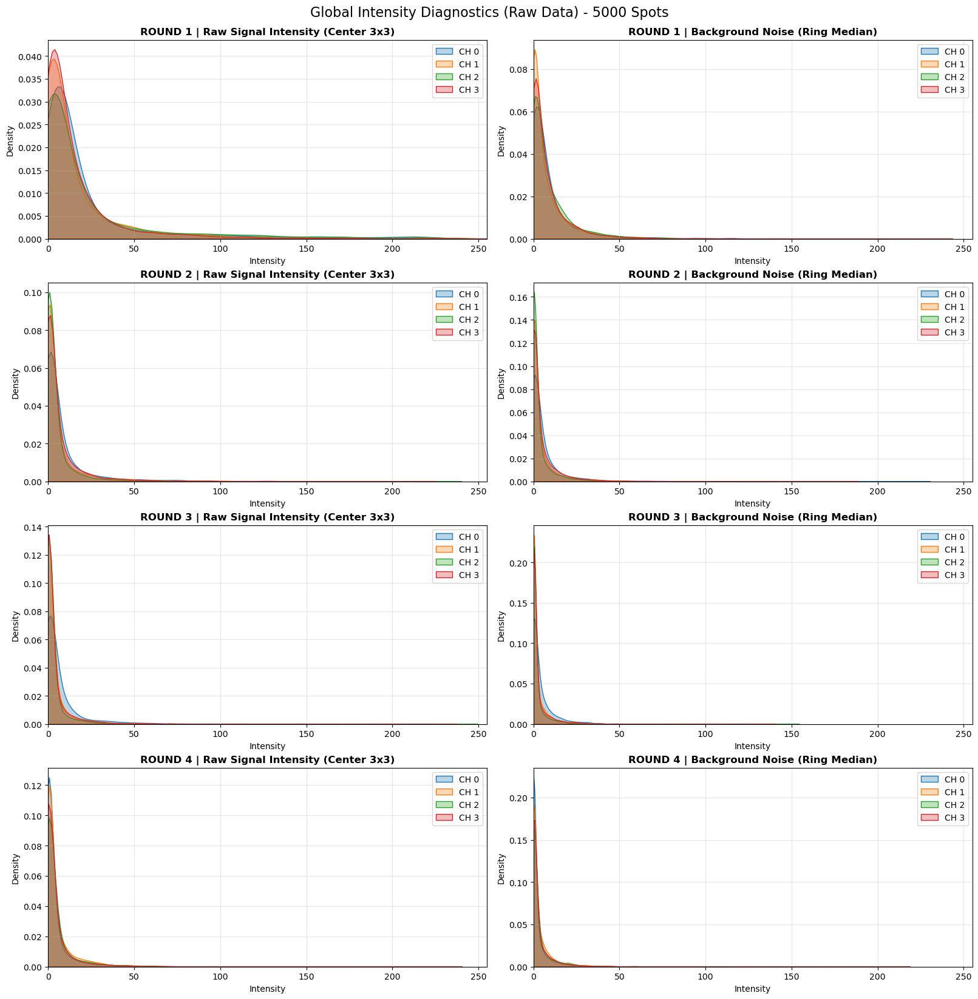

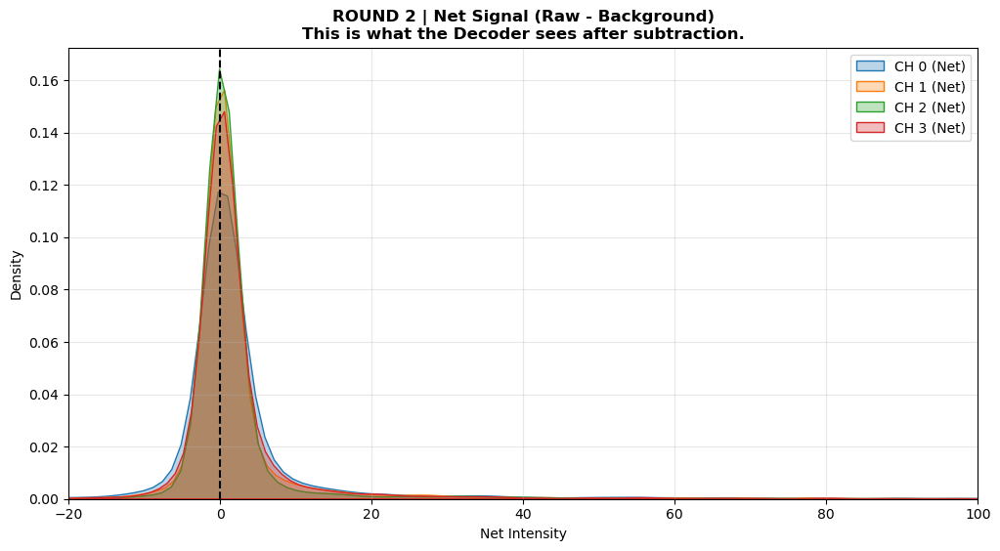

In [ ]:
%load_ext autoreload
%autoreload 2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from pathlib import Path
from tqdm import tqdm

# PyStar Imports
from pystar.infrastructure import load_config
from pystar.io import ImageLoader

# 1. Load Config
cfg = load_config("experiment_config.yaml") # 注意路径
loader = ImageLoader(cfg)
FOV_ID = 1

# 2. Load Existing Spots
spots_path = Path(cfg.pipeline.output.directory) / "spots" / f"spots_fov_{FOV_ID}.csv"
spots_df = pd.read_csv(spots_path)
print(f"Loaded {len(spots_df)} spots.")

# ----------------------------------------------------------------
# 2. Extract Logic (In-Memory, No Disk Write)
# ----------------------------------------------------------------
def get_offsets():
    """定义提取用的偏移量: 3x3 Signal, 7x7 Ring Background"""
    # Signal: 3x3
    sig_offsets = []
    for dy in [-1, 0, 1]:
        for dx in [-1, 0, 1]:
            sig_offsets.append([0, dy, dx]) # z=0
            
    # Background: Ring (r=3 to r=4) -> 7x7 outer, 5x5 inner gap
    bg_offsets = []
    for dy in range(-4, 5):
        for dx in range(-4, 5):
            dist = max(abs(dy), abs(dx))
            # Chebyshev distance based ring (square ring)
            if dist >= 3: 
                bg_offsets.append([0, dy, dx])
    return np.array(sig_offsets), np.array(bg_offsets)

sig_offsets, bg_offsets = get_offsets()
spot_coords = sample_df[['z', 'y', 'x']].values.astype(int)

# 容器：存储所有数据
# Structure: data_log['Round']['Channel'] = {'sig': [], 'bg': []}
data_log = {}

rounds = sorted(cfg.dataset.round_structure.keys())
channels = sorted(cfg.dataset.channel_roles.keys())

print("Starting Extraction Scan...")
for r in rounds:
    data_log[r] = {}
    valid_channels = cfg.dataset.round_structure[r]
    
    for c in valid_channels:
        # Load Image Slice
        img_path = loader._get_path(FOV_ID, r, c)
        # 用 compute() 读入内存
        vol = loader._lazy_load_tiff(img_path).compute() 
        D, H, W = vol.shape
        
        # 提取 Signal (Mean of 3x3)
        # Broadcasting: (N, 1, 3) + (1, 9, 3)
        s_coords = spot_coords[:, None, :] + sig_offsets[None, :, :]
        # Clip
        s_coords[..., 0] = np.clip(s_coords[..., 0], 0, D-1)
        s_coords[..., 1] = np.clip(s_coords[..., 1], 0, H-1)
        s_coords[..., 2] = np.clip(s_coords[..., 2], 0, W-1)
        
        # Extract & Mean
        sig_vals = vol[s_coords[...,0], s_coords[...,1], s_coords[...,2]]
        sig_mean = np.mean(sig_vals, axis=1) # Mean intensity
        
        # 提取 Background (Median of Ring)
        b_coords = spot_coords[:, None, :] + bg_offsets[None, :, :]
        b_coords[..., 0] = np.clip(b_coords[..., 0], 0, D-1)
        b_coords[..., 1] = np.clip(b_coords[..., 1], 0, H-1)
        b_coords[..., 2] = np.clip(b_coords[..., 2], 0, W-1)
        
        bg_vals = vol[b_coords[...,0], b_coords[...,1], b_coords[...,2]]
        bg_median = np.median(bg_vals, axis=1)
        
        data_log[r][c] = {'sig': sig_mean, 'bg': bg_median}
        
print("Extraction Done.")

# ----------------------------------------------------------------
# 3. Visualization: Global Dashboard
# ----------------------------------------------------------------
# 我们做一个大图：每一行是一个 Round，包含两个子图（Raw Signal, Background）

n_rows = len(rounds)
fig, axes = plt.subplots(n_rows, 2, figsize=(16, 4 * n_rows), constrained_layout=True)

if n_rows == 1: axes = [axes] # List wrapper

for idx, r in enumerate(rounds):
    ax_sig = axes[idx][0]
    ax_bg = axes[idx][1]
    
    valid_channels = cfg.dataset.round_structure[r]
    
    # Plot Logic
    for c in valid_channels:
        # 只看 Seq Channel, 除非你想看 DAPI
        role = cfg.dataset.channel_roles.get(c, 'unknown')
        if role != 'seq': continue 
        
        sig_data = data_log[r][c]['sig']
        bg_data = data_log[r][c]['bg']
        
        # KDE Plot
        sns.kdeplot(sig_data, ax=ax_sig, fill=True, alpha=0.3, label=f"CH {c}")
        sns.kdeplot(bg_data, ax=ax_bg, fill=True, alpha=0.3, label=f"CH {c}")
    
    # Beautify Signal Plot
    ax_sig.set_title(f"ROUND {r} | Raw Signal Intensity (Center 3x3)", fontsize=12, fontweight='bold')
    ax_sig.set_xlim(0, 255) # 假设 8-bit
    ax_sig.set_xlabel("Intensity")
    ax_sig.legend(loc='upper right')
    ax_sig.grid(True, alpha=0.3)
    
    # Beautify Background Plot
    ax_bg.set_title(f"ROUND {r} | Background Noise (Ring Median)", fontsize=12, fontweight='bold')
    ax_bg.set_xlim(0, 255)
    ax_bg.set_xlabel("Intensity")
    ax_bg.legend(loc='upper right')
    ax_bg.grid(True, alpha=0.3)

plt.suptitle(f"Global Intensity Diagnostics (Raw Data) - {len(sample_df)} Spots", fontsize=16, y=1.02)
plt.show()

# ----------------------------------------------------------------
# 4. Visualization: "The Ghost Buster" (Round 2 Deep Dive)
# ----------------------------------------------------------------
# 专门画 Round 2 的 "Net Signal" (纠正后的信号)
target_round = 2 
if target_round in data_log:
    plt.figure(figsize=(12, 6))
    
    valid_channels = cfg.dataset.round_structure[target_round]
    for c in valid_channels:
        role = cfg.dataset.channel_roles.get(c, 'unknown')
        if role != 'seq': continue
        
        raw = data_log[target_round][c]['sig']
        bg = data_log[target_round][c]['bg']
        net = raw - bg # 减法！
        
        sns.kdeplot(net, fill=True, alpha=0.3, label=f"CH {c} (Net)")
        
    plt.axvline(0, color='black', linestyle='--')
    plt.title(f"ROUND {target_round} | Net Signal (Raw - Background)\nThis is what the Decoder sees after subtraction.", fontweight='bold')
    plt.xlabel("Net Intensity")
    plt.xlim(-20, 100) # 关注低强度的信号区
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()
#是否有某个channel的光强偏强，更靠右？